In [13]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.express as px
import plotly.graph_objects as go
import voila

from sklearn.metrics import roc_curve, auc
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve, roc_auc_score

import dash
import dash_bootstrap_components as dbc
from dash import html, Dash, dcc


In [14]:
# first plot
df = pd.read_csv('dashboard.csv')
df['order_date'] = pd.to_datetime(df['order_date'],utc=True)
df.sort_values(by='order_date', inplace = True) 
df.reset_index(inplace = True, drop=True) 
df.head()

/var/folders/1_/83qhk9ps6fd0yym23nn9nfz00000gn/T/ipykernel_4047/467849995.py:2: DtypeWarning:

Columns (0) have mixed types. Specify dtype option on import or set low_memory=False.



,order_id,order_date,status,item_id,qty_ordered,price,value,county,payment_method,category,...,age,user name,state,discount_percent,year,month,actual,forcast,previous,label
0,100354678,2020-10-01 00:00:00+00:00,received,574772.0,21.0,89.9,1798.0,Harmon,cod,Men's Fashion,...,43.0,jwtitus,OK,0.0,2020,10,0.0,0.1,0.2,bearish
1,100354820,2020-10-01 00:00:00+00:00,canceled,575045.0,2.0,39.9,39.9,Chance,Payaxis,Home & Living,...,57.0,adviens,MD,0.0,2020,10,0.0,0.1,0.2,bearish
2,100354819,2020-10-01 00:00:00+00:00,canceled,575044.0,2.0,634.5,634.5,Chance,Easypay,Appliances,...,57.0,adviens,MD,0.0,2020,10,0.0,0.1,0.2,bearish
3,100354818,2020-10-01 00:00:00+00:00,canceled,575043.0,2.0,150.7,150.7,Chance,Easypay_MA,Superstore,...,57.0,adviens,MD,0.0,2020,10,0.0,0.1,0.2,bearish
4,100354817,2020-10-01 00:00:00+00:00,order_refunded,575042.0,2.0,1784.9,1784.9,Smith,cod,Mobiles & Tablets,...,75.0,symccorkle,TN,0.0,2020,10,0.0,0.1,0.2,bearish


In [15]:
#px.set_mapbox_access_token(open(".mapbox_token").read())
#px.set_mapbox_access_token("pk.eyJ1IjoicGxvdGx5bWFwYm94IiwiYSI6ImNqdnBvNDMyaTAxYzkzeW5ubWdpZ2VjbmMifQ.TXcBE-xg9BFdV2ocecc_7g")

In [16]:
df2 = df[['order_date', 'category', 'value']]
# create the bar chart
# group the data by month and category, and compute the sum of the values
df_agg = df2.groupby(['order_date', 'category'])['value'].sum()

# reset the index and rename the columns
df_agg = df_agg.reset_index()
#df_agg = df_agg.rename(columns={'order_date': 'month', 'value': 'sum_value'})

# create the bar chart
fig1 = px.line(df_agg, x='order_date', y='value', color='category', title='Revenue per ProductCategory')

fig1.update_xaxes(
    rangeselector=dict(
        buttons=list([
            dict(count=1, label="1m", step="month", stepmode="backward"),
            dict(count=6, label="6m", step="month", stepmode="backward"),
            dict(count=1, label="YTD", step="year", stepmode="todate"),
            dict(count=1, label="1y", step="year", stepmode="backward"),
            dict(step="all")
        ])
    )
)

# show the plot
fig1.show()

<AxesSubplot: xlabel='None-category', ylabel='None-category'>

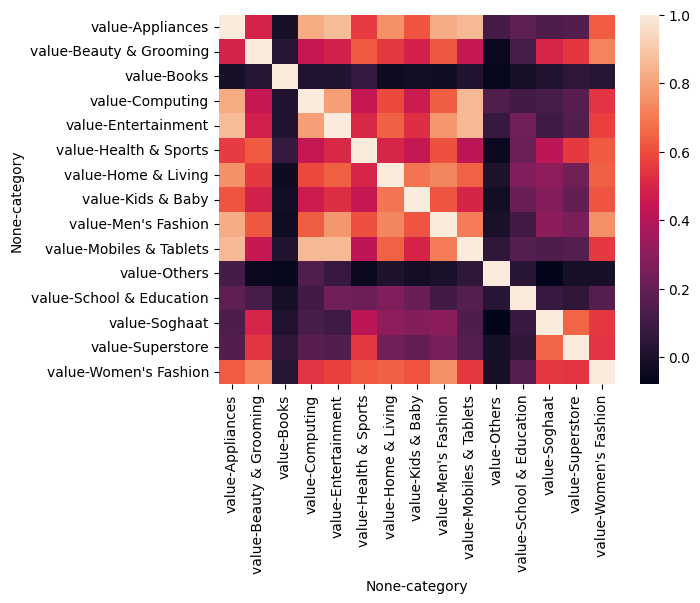

In [23]:
df31 = df[['order_date', 'category', 'value']]
# Create the pivot table
df31 = df31.groupby(['order_date', 'category']).sum().unstack()
corr = df31.corr()
sns.heatmap(corr)

In [5]:
df3 = df[['year', 'month', 'label']]
# create the plot
df3_agg = df3.groupby(['year', 'month', 'label']).size().reset_index()

# rename the column
df3_agg = df3_agg.rename(columns={0: 'orders'})
df3_agg['time'] = df3_agg['year'].astype(str).str.cat(df3_agg['month'].astype(str), sep='/')

fig2 = px.bar(df3_agg, x="time", y="orders", color="label", title="Economy Strength")
fig2.update_layout(xaxis={'categoryorder':'category ascending'})
fig2.show()


In [6]:
#user = df.groupby('user name')['value'].sum()
#user = pd.DataFrame({'money_spent':user}).reset_index(drop=True)
df4 = df[['year', 'month', 'user name', 'value']]
df4_agg = df4.groupby(['year', 'month'])['value'].mean().reset_index()
df4_agg['time'] = df4_agg['year'].astype(str).str.cat(df4_agg['month'].astype(str), sep='/')
df4_agg = df4_agg.rename(columns={'value': 'avg. purchase'})

# create the bar chart
fig3 = px.line(df4_agg, x='time', y='avg. purchase', title='Average Cart Value')

fig3.update_xaxes(
    rangeslider_visible=True,
)

# show the plot
fig3.show()
#df.groupby('user name')['value'].sum()


In [7]:
df_model = df.copy()
df_model.drop(columns=['user name','actual','forcast','previous', 'order_id','item_id'], axis=1, inplace=True)
df_model['order_date'] = pd.to_datetime(df_model['order_date'])
df_model = pd.get_dummies(df_model, columns=['status', 'county', 'payment_method', 'category','gender', 'state'])
df_model = df_model.drop(['order_date','year','month'], axis=1)
#Seperate train and test data
X_train, X_test, y_train, y_test = train_test_split(df_model.drop('label', axis=1),df_model['label'],test_size = 0.4,random_state = 10)



In [8]:
#model
import pickle

# Load the model from the file
with open('model.pkl', 'rb') as f:
    model = pickle.load(f)

y_scores = model.predict_proba(X_train)

# One hot encode the labels in order to plot them
y_onehot = pd.get_dummies(y_train, columns=model.classes_)

# Create an empty figure, and iteratively add new lines
# every time we compute a new class
fig4 = go.Figure()
fig4.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

for i in range(y_scores.shape[1]):
    y_true = y_onehot.iloc[:, i]
    y_score = y_scores[:, i]

    fpr, tpr, _ = roc_curve(y_true, y_score)
    auc_score = roc_auc_score(y_true, y_score)

    name = f"{y_onehot.columns[i]} (AUC={auc_score:.2f})"
    fig4.add_trace(go.Scatter(x=fpr, y=tpr, name=name, mode='lines'))

fig4.update_layout(
    xaxis_title='False Positive Rate',
    yaxis_title='True Positive Rate',
    title='ROC Curve',
    yaxis=dict(scaleanchor="x", scaleratio=1),
    xaxis=dict(constrain='domain'),
    width=500, height=400
)
fig4.show()


/opt/homebrew/lib/python3.10/site-packages/sklearn/base.py:443: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names



In [9]:
#PI chart
df5 = df[['value', 'age', 'gender', 'user name']]
df5 = df5.groupby(['age', 'gender', 'user name'])['value'].mean().reset_index()
fig5 = px.scatter(df5, x="age", y="value", color="gender", title='Average Spending')
fig5.show()

In [10]:
df6 = df[['age', 'gender']]
fig6 = px.box(df6, x="gender", y="age")
fig6.show()

In [ ]:



# create the Dash app
app = app = dash.Dash(external_stylesheets=[dbc.themes.BOOTSTRAP])

row = html.Div(
    [
        dbc.Row([
                dbc.Col(html.Div(dcc.Graph(figure=fig1)), width=8),
                dbc.Col(html.Div(dcc.Graph(figure=fig2))),
            ],className="g-0"),
        dbc.Row(
            [
                dbc.Col(html.Div(dcc.Graph(figure=fig3)), width=3),
                dbc.Col(html.Div(dcc.Graph(figure=fig5)), width=5),
                dbc.Col(html.Div(dcc.Graph(figure=fig4)), width=3),
            ],className="g-0"
        ),
    ]
)

app.layout = dbc.Container(
    row
)
app.run_server()

Dash is running on http://127.0.0.1:8050/

 * Serving Flask app '__main__'
 * Debug mode: off


 * Running on http://127.0.0.1:8050
Press CTRL+C to quit
127.0.0.1 - - [11/Jan/2023 16:35:16] "GET / HTTP/1.1" 200 -
127.0.0.1 - - [11/Jan/2023 16:35:16] "GET /_dash-dependencies HTTP/1.1" 200 -
127.0.0.1 - - [11/Jan/2023 16:35:16] "GET /_dash-layout HTTP/1.1" 200 -
127.0.0.1 - - [11/Jan/2023 16:35:16] "GET /_favicon.ico?v=2.7.1 HTTP/1.1" 200 -
127.0.0.1 - - [11/Jan/2023 16:35:16] "GET /_dash-component-suites/dash/dcc/async-graph.js HTTP/1.1" 304 -
127.0.0.1 - - [11/Jan/2023 16:35:16] "GET /_dash-component-suites/dash/dcc/async-plotlyjs.js HTTP/1.1" 304 -
